In [ ]:
qfrom IPython.display import clear_output
!pip install  transformers --quiet
!pip install rouge_score -q
!pip install opendatasets -q
!pip install transformers accelerate -q
!pip install evaluate -q
!pip install huggingface_hub -q
!pip install sentencepiece -q
clear_output()

In [ ]:
import requests

#for base and medium
from transformers import GPT2LMHeadModel

#from tqdm import tqdm
from tqdm.notebook import tqdm

from time import sleep
import os

import datasets
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import io, transforms
from torch.utils.data import Dataset, DataLoader, random_split

from transformers import VisionEncoderDecoderModel,GPT2TokenizerFast, ViTImageProcessor, pipeline,VisionEncoderDecoderConfig
from transformers import AutoTokenizer, MarianMTModel
from transformers import MarianForCausalLM, MarianTokenizer

import evaluate
#from multilingual_clip import pt_multilingual_clip

if torch.cuda.is_available():    

    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
from huggingface_hub import notebook_login
notebook_login()

In [ ]:
english_flickr_model_name = "AsmaMassad/swin-gpt2-image-captioning-flickr8k"
english_coco_model_name  = "AsmaMassad/swin-gpt2-image-captioning-coco"
arabic_flickr_model_name  = "AsmaMassad/swin-aragpt2-image-captioning-flickr8k"

In [ ]:
config_english_flickr = VisionEncoderDecoderConfig.from_pretrained(english_flickr_model_name)
english_flickr_model = VisionEncoderDecoderModel.from_pretrained(english_flickr_model_name, config=config_english_flickr).to(device)

config_english_coco = VisionEncoderDecoderConfig.from_pretrained(english_coco_model_name)
english_coco_model = VisionEncoderDecoderModel.from_pretrained(english_coco_model_name, config=config_english_coco).to(device)

config_arabic_flickr = VisionEncoderDecoderConfig.from_pretrained(arabic_flickr_model_name)
arabic_flickr_model = VisionEncoderDecoderModel.from_pretrained(arabic_flickr_model_name, config=config_arabic_flickr).to(device)

In [ ]:
encoder_model = "microsoft/swin-base-patch4-window7-224-in22k"
english_tokenizer = GPT2TokenizerFast.from_pretrained("gpt2")
arabic_tokenizer = GPT2TokenizerFast.from_pretrained("aubmindlab/aragpt2-base")
image_processor = ViTImageProcessor.from_pretrained(encoder_model)

'''
image_processor1 = ViTImageProcessor.from_pretrained(arabic_flickr_model)
image_processor2 = ViTImageProcessor.from_pretrained(english_flickr_model)
image_processor3 = ViTImageProcessor.from_pretrained(english_coco_model)'''


In [ ]:
import opendatasets as od
od.download(
    "https://www.kaggle.com/datasets/adityajn105/flickr8k")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: asmamasssad
Your Kaggle Key: ··········


100%|██████████| 1.04G/1.04G [00:09<00:00, 113MB/s] 


In [ ]:
def load_document(filename):
    file=open(filename,'r',encoding='utf-8')
    text=file.read()
    file.close()
    return text

In [ ]:
text = load_document('Flickr8k.arabic.txt')

In [ ]:

datatxt = []
for line in text.split('\n'):
    col = line.split('\t')
    if len(col) == 1:
        continue
    w = col[0].split("#")#
    datatxt.append(w + [col[1].lower()])

data = pd.DataFrame(datatxt,columns=["image","index","caption"])
data = data.reindex(columns =['index','image','caption'])
data = data[data.image != '2258277193_586949ec62.jpg']
uni_filenames = np.unique(data.image.values)

data.head()

,index,image,caption
0,0,1000268201_693b08cb0e.jpg,طفلة صغيرة تتسلق إلى مسرح خشبي
1,1,1000268201_693b08cb0e.jpg,طفلة صغيرة تتسلق الدرج إلى منزلها
2,2,1000268201_693b08cb0e.jpg,فتاة صغيرة في ثوب وردي تذهب إلى المقصورة الخشبية
3,0,1001773457_577c3a7d70.jpg,كلب أسود وكلب ثلاثي الألوان يلعبان مع بعضهما ا...
4,1,1001773457_577c3a7d70.jpg,كلب أسود وكلب أبيض ببقع بنية يحدقان في بعضهما ...


In [ ]:
def load_document(filename):
    file=open(filename,'r',encoding='utf-8')
    text=file.read()
    file.close()
    return text

In [ ]:
data_en=  pd.read_csv("flickr8k/captions.txt")
data_en

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [ ]:
data_en = data_en.groupby('image').apply(lambda x: x.head(3)).reset_index(drop=True)

In [ ]:
split_ratio = 0.7
split_index = int(len(data) * split_ratio)

train_df  = data[:split_index]
val_df = data[split_index:]

split_ratio2 = 0.5
split_index2 = int(len(val_df) * split_ratio)

validation_df = val_df[:split_index2]
test_df= val_df[split_index2:]

In [ ]:
'''#train_df , val_df = train_test_split(data , test_size = 0.2)

split_ratio = 0.7
split_index = int(len(data_en) * split_ratio)

en_train_df  = data_en[:split_index]
en_val_df = data_en[split_index:]

split_ratio2 = 0.5
split_index2 = int(len(en_val_df) * split_ratio)

en_validation_df = en_val_df[:split_index2]
en_test_df= en_val_df[split_index2:]'''

In [ ]:
test_df['en_caption'] = en_test_df['caption']

<ipython-input-16-b2192fd2b0a4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['en_caption'] = en_test_df['caption']


In [ ]:
test_df

,index,image,caption,en_caption
22088,2,460478198_83039f2593.jpg,اثنين من الكلاب تطارد بعضها البعض بالقرب من ا...,"Two dogs , a spaniel and a husky , chase each ..."
22089,0,460781612_6815c74d37.jpg,كلب أبيض وأسود يمسكان بالصحن الطائر في الجو,A black and white dog catches a Frisbee in mid...
22090,1,460781612_6815c74d37.jpg,كلب أبيض وأسود يقفزان في الهواء للقبض على الفر...,A black and white dog is midjump and has a Fri...
22091,2,460781612_6815c74d37.jpg,كلب يقفز في الهواء ، واصطياد الصحن الطائر في فمه,A black and white dog jumps up in the air to c...
22092,0,460935487_75b2da7854.jpg,كلبان أبيض وأسود يركضان نحو بعض النباتات المح...,A black and white dog is running up a path tow...
...,...,...,...,...
24268,1,997338199_7343367d7f.jpg,امرأة تقف بالقرب من جدار مزخرف تكتب,a woman behind a scrolled wall is writing
24269,2,997338199_7343367d7f.jpg,الجدران مغطاة بالذهب والأنماط,A woman standing near a decorated wall writes .
24270,0,997722733_0cb5439472.jpg,رجل يرتدي قميصًا ورديًا يتسلق وجهًا صخريًا,A man in a pink shirt climbs a rock face
24271,1,997722733_0cb5439472.jpg,رجل يتسلق الصخور في الهواء,A man is rock climbing high in the air .


In [ ]:

rouge = evaluate.load("rouge")
bleu = evaluate.load("bleu")
meteor =  evaluate.load("meteor")

def computeMetricsSTR(pred_str, labels_str):
    
    rouge_result = rouge.compute(predictions=pred_str, references=labels_str)
    # multiply by 100 to get the same scale as the rouge score
    rouge_result = {k: round(v * 100, 4) for k, v in rouge_result.items()}
    # meteor
    meteor_result = meteor.compute(predictions=pred_str, references=labels_str)
    # compute the bleu score
    bleu_result = bleu.compute(predictions=pred_str, references=labels_str)
     # compute the bleu score
    bleu1_result = bleu.compute(predictions=pred_str, references=labels_str, max_order =1)
    bleu2_result = bleu.compute(predictions=pred_str, references=labels_str, max_order =2)
    bleu3_result = bleu.compute(predictions=pred_str, references=labels_str, max_order =3)
    bleu4_result = bleu.compute(predictions=pred_str, references=labels_str, max_order =4)
    # get the length of the generated captions
    generation_length = bleu_result["translation_length"]
    return {
        **rouge_result, 
        "meteor": round(meteor_result['meteor']*100, 2) , #round(meteor_result['meteor'], 4),
        "bleu": round(bleu_result["bleu"] * 100, 4), 
        "bleu1": round(bleu1_result["bleu"] * 100, 4), #round(bleu1_result["bleu"] * 100, 4), 
        "bleu2": round(bleu2_result["bleu"] * 100, 4), # round(bleu2_result["bleu"] * 100, 4), 
        "bleu3": round(bleu3_result["bleu"]* 100 , 4), #round(bleu3_result["bleu"] * 100, 4), 
        "bleu4": round(bleu4_result["bleu"] * 100, 4),#round(bleu4_result["bleu"] * 100, 4)
        #"gen_len": bleu_result["translation_length"] / len(preds)
    }

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
mt_model_name = "Helsinki-NLP/opus-mt-en-ar"
mt_model = MarianMTModel.from_pretrained(mt_model_name)
mt_tokenizer = AutoTokenizer.from_pretrained(mt_model_name)

def translateCaption(en_cap):
  batch = mt_tokenizer([en_cap], return_tensors="pt")
  generated_ids = mt_model.generate(**batch)
  arabic_generated_caption = mt_tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]

  return arabic_generated_caption

/usr/local/lib/python3.10/dist-packages/transformers/models/marian/tokenization_marian.py:194: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


In [ ]:

def testCaptionGeneration( df,  arabic_tokenizer, english_tokenizer, image_processor, native_model, flickr_model, coco_model):  
  root_dir = "flickr8k/Images/"
  native_caps = []
  coco_en_caps = []
  coco_tr_caps = []
  flickr_tr_caps = []
  flickr_en_caps = []
  golden_caps =[]
  en_golden_caps=[]
  print(len(df))
  for i in  tqdm(range(len(df))):
    sleep(3)
    caption = df.caption.iloc[i]
    golden_caps.append(caption)
    #print('golden_caps',caption)
    en_caption = df.en_caption.iloc[i]
    en_golden_caps.append(en_caption)
    #print('en_golden_caps',en_caption)

    image = df.image.iloc[i]
    img_path = os.path.join(root_dir , image)
    img = Image.open(img_path).convert("RGB")
    img_proc = image_processor(img, return_tensors="pt").to(device)

    # Native Arabic captions
    native_output = native_model.generate(**img_proc)
    native_caption = arabic_tokenizer.batch_decode(native_output, skip_special_tokens=True)[0]
    native_caps.append(native_caption)
    #print('native_caption',native_caption)

    # translated coco captions
    coco_tr_output = coco_model.generate(**img_proc)
    coco_caption = english_tokenizer.batch_decode(coco_tr_output, skip_special_tokens=True)[0]
    coco_en_caps.append(coco_caption)
    coco_tr_caption = translateCaption(coco_caption)
    coco_tr_caps.append(coco_tr_caption)
    #print('coco_caption',coco_caption)
    #print('coco_tr_caption',coco_tr_caption)
    
    # translated coco captions
    flickr_tr_output = flickr_model.generate(**img_proc)
    flickr_caption = english_tokenizer.batch_decode(flickr_tr_output, skip_special_tokens=True)[0]
    flickr_en_caps.append(flickr_caption)
    flickr_tr_caption = translateCaption(flickr_caption)
    flickr_tr_caps.append(flickr_tr_caption)
    #print('flickr_caption',flickr_caption)
    #print('flickr_tr_caption',flickr_tr_caption)

  native_metrics = computeMetricsSTR(native_caps, golden_caps)
  coco_tr_metrics = computeMetricsSTR(coco_tr_caps, golden_caps)
  flickr8k_tr_metrics = computeMetricsSTR(flickr_tr_caps, golden_caps)
  coco_en_metrics = computeMetricsSTR(coco_en_caps, en_golden_caps)
  flickr8k_en_metrics = computeMetricsSTR(flickr_en_caps, en_golden_caps)

  return native_metrics, coco_tr_metrics, flickr8k_tr_metrics, coco_en_metrics, flickr8k_en_metrics


In [ ]:

native_metrics, coco_tr_metrics, flickr8k_tr_metrics, coco_en_metrics, flickr8k_en_metrics = testCaptionGeneration( test_df,  arabic_tokenizer, english_tokenizer, image_processor, arabic_flickr_model, english_flickr_model, english_coco_model)

2185


  0%|          | 0/2185 [00:00<?, ?it/s]

In [ ]:
print("native_metrics ", native_metrics) 
print("coco_tr_metrics ",coco_tr_metrics) 
print("flickr8k_tr_metrics ",  flickr8k_tr_metrics) 
print("coco_en_metrics ",  coco_en_metrics) 
print("flickr8k_en_metrics", flickr8k_en_metrics)

native_metrics  {'rouge1': 0.0, 'rouge2': 0.0, 'rougeL': 0.0, 'rougeLsum': 0.0, 'meteor': 5.83, 'bleu': 0.3444, 'bleu1': 6.5842, 'bleu2': 2.1071, 'bleu3': 0.835, 'bleu4': 0.3444}
coco_tr_metrics  {'rouge1': 0.0, 'rouge2': 0.0, 'rougeL': 0.0, 'rougeLsum': 0.0, 'meteor': 13.45, 'bleu': 2.6431, 'bleu1': 19.0605, 'bleu2': 9.7354, 'bleu3': 4.9042, 'bleu4': 2.6431}
flickr8k_tr_metrics  {'rouge1': 0.0, 'rouge2': 0.0, 'rougeL': 0.0, 'rougeLsum': 0.0, 'meteor': 4.29, 'bleu': 0.1704, 'bleu1': 5.5419, 'bleu2': 1.3264, 'bleu3': 0.4259, 'bleu4': 0.1704}
coco_en_metrics  {'rouge1': 35.9137, 'rouge2': 11.3545, 'rougeL': 33.6625, 'rougeLsum': 33.6484, 'meteor': 29.48, 'bleu': 6.3086, 'bleu1': 37.8182, 'bleu2': 19.593, 'bleu3': 10.9818, 'bleu4': 6.3086}
flickr8k_en_metrics {'rouge1': 22.5797, 'rouge2': 4.6402, 'rougeL': 20.8329, 'rougeLsum': 20.8177, 'meteor': 15.68, 'bleu': 2.1623, 'bleu1': 18.2585, 'bleu2': 8.1364, 'bleu3': 3.8209, 'bleu4': 2.1623}


# Predictions

In [ ]:

def getCaptions(image):
  img = image_processor(image, return_tensors="pt").to(device)

  output = arabic_flickr_model.generate(**img)
  ar_flickr_caption = arabic_tokenizer.batch_decode(output, skip_special_tokens=True)[0]
  print('Arabic Flickr-Model Caption')
  print(ar_flickr_caption)
  
  output = english_flickr_model.generate(**img)
  en_flickr_caption = english_tokenizer.batch_decode(output, skip_special_tokens=True)[0]
  print('English Flickr-Model Caption')
  print(en_flickr_caption)
  print('Translated Flickr-Model Caption')
  tr_flickr_caption = translateCaption(en_flickr_caption)
  print(tr_flickr_caption)

  output = english_coco_model.generate(**img)
  en_coco_caption = english_tokenizer.batch_decode(output, skip_special_tokens=True)[0]
  print('English COCO-Model Caption')
  print(en_coco_caption)
  tr_coco_caption = translateCaption(en_coco_caption)
  print('Translated COCO-Model Caption')
  print(tr_coco_caption)



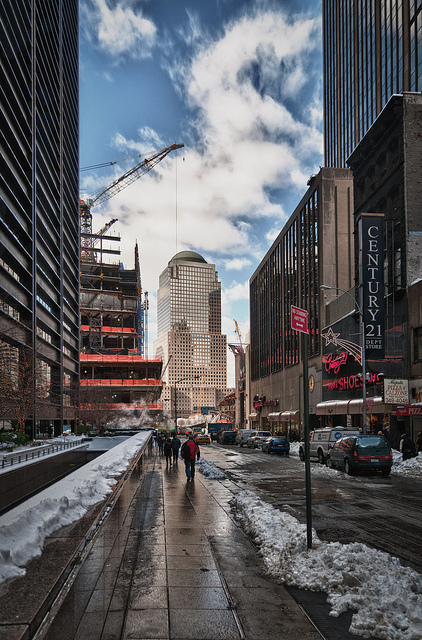

In [ ]:
# load displayer
from IPython.display import display

url = "http://images.cocodataset.org/test-stuff2017/000000009384.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1346: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Arabic Flickr-Model Caption
صبي صغير في قميص أحمر يلعب في العشب الأخضر مع كرة في فمه
English Flickr-Model Caption
A man in a blue shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1346: UserWarning: Using `max_length`'s default (512) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


رجل يرتدي قميصاً أزرق وقميصاً أزرق وجينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A man walking down a street in the rain.
Translated COCO-Model Caption
رجل يمشي في الشارع في المطر


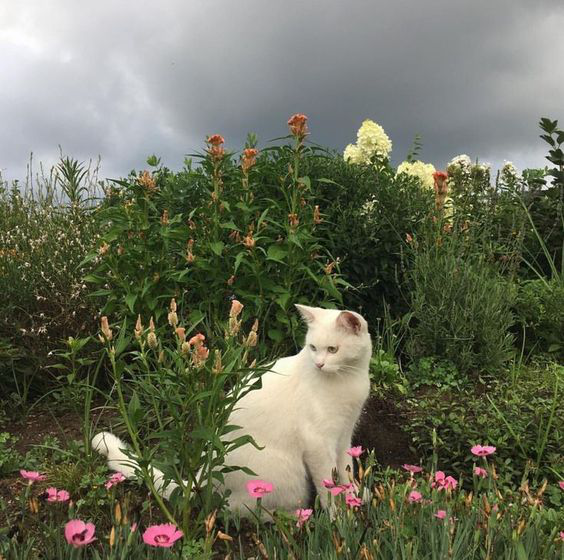

In [ ]:
url = "https://i.pinimg.com/564x/89/26/e5/8926e5f91a6a881ed403e7fa32827198.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أبيض وأسود يركض عبر العشب الجاف ، في فمه ، في العشب الجاف
English Flickr-Model Caption
A man in a blue shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل يرتدي قميصاً أزرق وقميصاً أزرق وجينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A white cat sitting in a field of flowers.
Translated COCO-Model Caption
قطة بيضاء تجلس في حقل من الأزهار


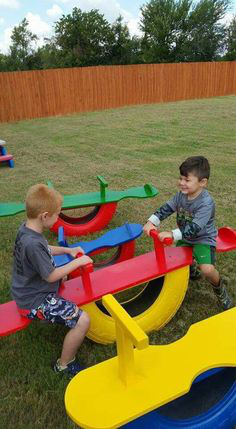

In [ ]:

url = "https://i.pinimg.com/236x/5d/06/2f/5d062ff66fef2e9959310fd853fa25da.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أسود وكلب أبيض وأسود يطاردان بعضهما البعض في حقل عشبي
English Flickr-Model Caption
A man in a blue shirt and jeans is standing in front of a building with a sign that
Translated Flickr-Model Caption
رجل في قميص أزرق وجينز يقف أمام مبنى مع إشارة
English COCO-Model Caption
Two children sitting on a toy boat with a toy boat in the background.
Translated COCO-Model Caption
طفلان يجلسان على قارب لعبة مع قارب لعبة في الخلفية


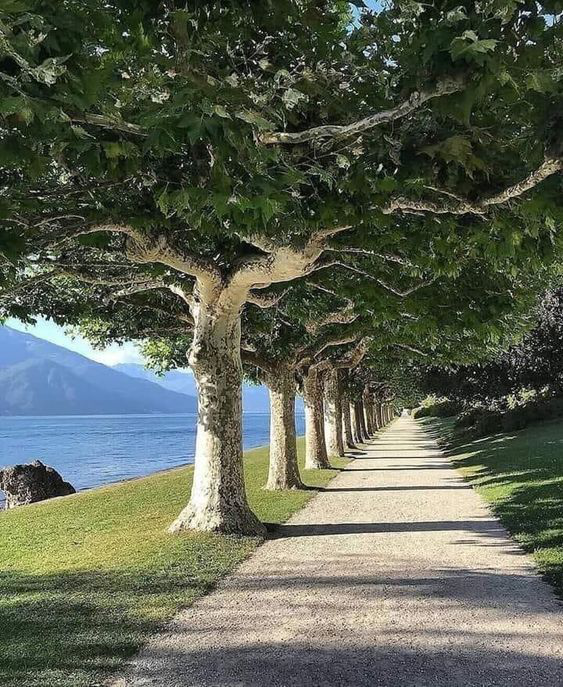

In [ ]:


url = "https://i.pinimg.com/564x/8b/a8/73/8ba873f4a8d3cc2d1151a0cf3cc23d51.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أبيض وأسود يتسلق جدار صخري في الغابة
English Flickr-Model Caption
A man in a blue shirt and jeans is standing in front of a building with a sign that
Translated Flickr-Model Caption
رجل في قميص أزرق وجينز يقف أمام مبنى مع إشارة
English COCO-Model Caption
A tree is in the middle of a park.
Translated COCO-Model Caption
شجرة في منتصف منتزه.


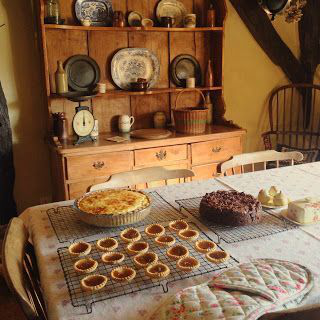

In [ ]:
url = "https://i.pinimg.com/564x/cf/fc/1d/cffc1d04109dbf448046da89a8a6cc7b.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أبيض وأسود يتسابقان في حقل عشبي
English Flickr-Model Caption
A man in a blue shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل يرتدي قميصاً أزرق وقميصاً أزرق وجينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A table with a tray of cakes and pastries.
Translated COCO-Model Caption
طاولة مع صينية من الكعك والمعجنات.


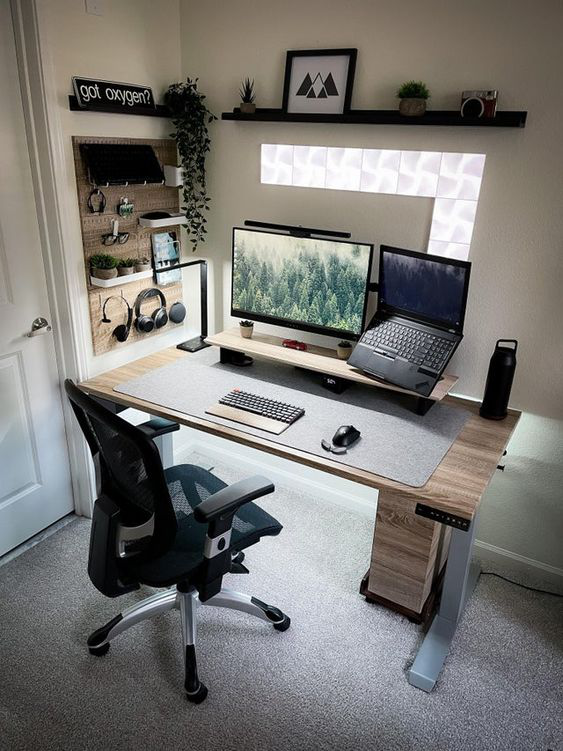

In [ ]:
url = "https://i.pinimg.com/564x/fc/4d/6d/fc4d6da8de415fe6cb8965327bc0f7fb.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
صبي صغير في قميص أحمر ، يرتدي قميصا أزرق اللون ، يجلس على مقعد في الفناء الخلفي
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A desk with a computer and a chair.
Translated COCO-Model Caption
مكتب مع حاسوب وكرسي.


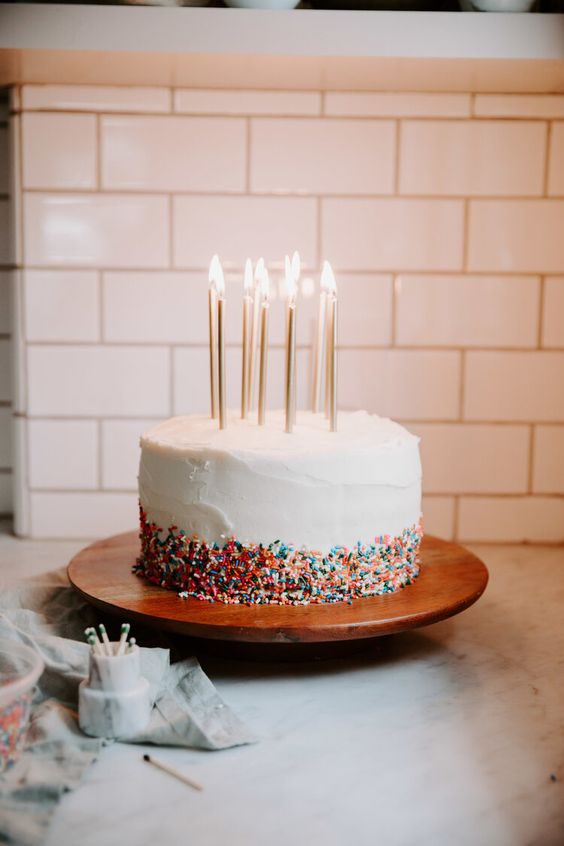

In [ ]:

url = "https://i.pinimg.com/564x/b2/32/98/b2329834548f46aac64fb198e5cc531f.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أبيض وأسود يتسلق جدار صخري في حقل عشبي
English Flickr-Model Caption
A man and a woman are standing in front of a building with a sign that reads, "
Translated Flickr-Model Caption
رجل وامرأة يقفان أمام مبنى بعلامة تقول: "
English COCO-Model Caption
A cake with candles on top of it.
Translated COCO-Model Caption
كعكة مع شموع فوقها


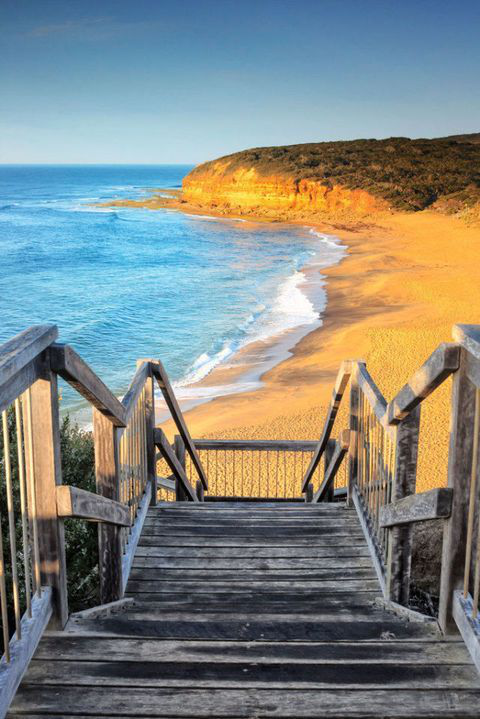

In [ ]:

url = "https://i.pinimg.com/564x/78/62/ef/7862ef32bbbbad494c16b89833802ead.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
صبي صغير في قميص أحمر ، يرتدي قميصا أحمر ، يجلس على مقعد في الفناء الخلفي ،
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A wooden deck with a wooden railing and a beach.
Translated COCO-Model Caption
سطح خشبي بسياج خشبي وشاطئ.


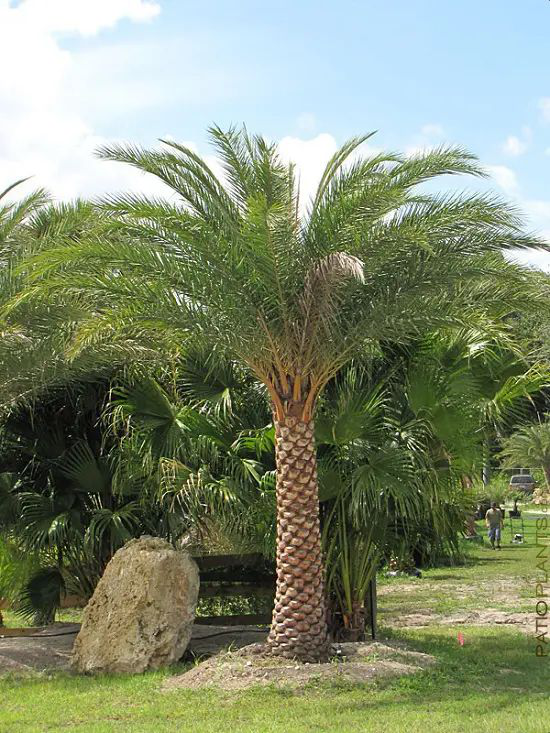

In [ ]:

url = "https://i.pinimg.com/564x/8d/fb/74/8dfb749fa9139f24cc37cdb76db77b7f.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أسود وكلب أبيض وأسود يتسابقان على العشب الأخضر في الغابة
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A large tree with a large trunk in a field.
Translated COCO-Model Caption
شجرة كبيرة مع جذع كبير في حقل.


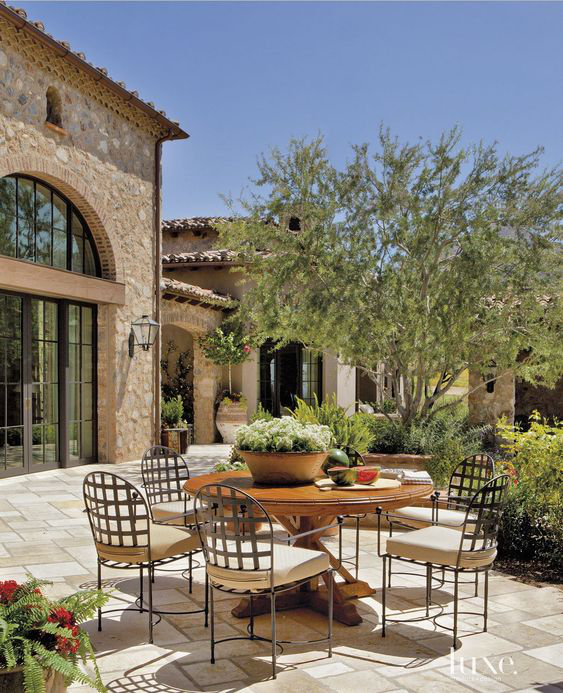

In [ ]:

url = "https://i.pinimg.com/564x/b1/b0/91/b1b0914a3f1d03aca25752e5456b4b15.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
كلب أبيض وأسود يتسلق جدار صخري على قمة الجبل
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A patio table with chairs and a table with a basket.
Translated COCO-Model Caption
طاولة بالفناء مع كراسي و طاولة بسلة


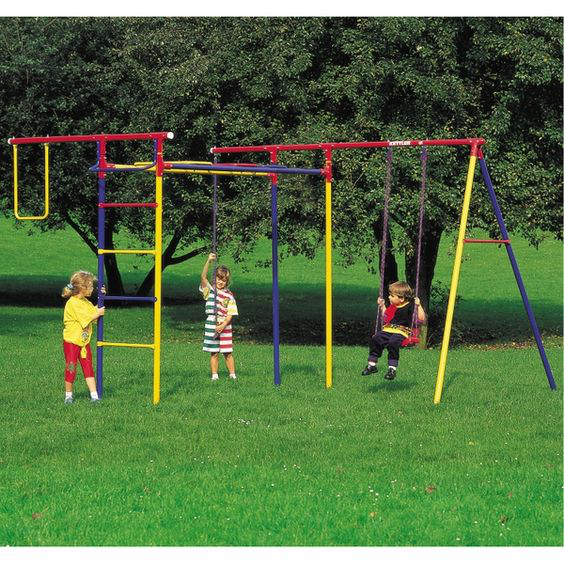

In [ ]:
url = "https://i.pinimg.com/564x/f2/46/4e/f2464e3e7a45f1d197318b086e86a17a.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
صبي صغير يرتدي قميصا أحمر وقبعة حمراء يجلس على مقعد خشبي في الفناء الخلفي للمبنى ،
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A group of children playing in a park.
Translated COCO-Model Caption
مجموعة من الأطفال يلعبون في حديقة


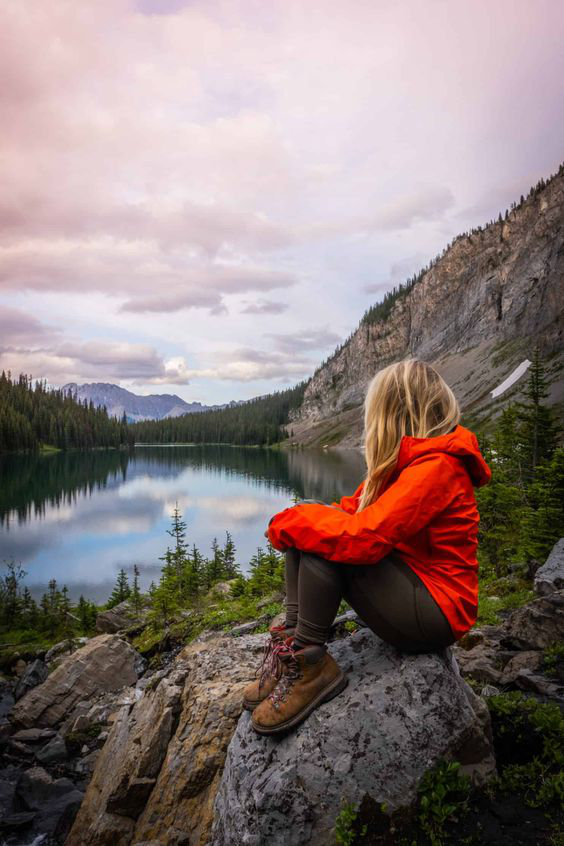

In [ ]:

url = "https://i.pinimg.com/564x/13/0a/fe/130afeb02849e5daa16afdeefaab4da9.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)

Arabic Flickr-Model Caption
صبي صغير في قميص أحمر ، يرتدي قميصا أزرق اللون ، يقف في بركة من الماء ،
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A woman sitting on a rock near a body of water.
Translated COCO-Model Caption
امرأة تجلس على صخرة بالقرب من كتلة من الماء.


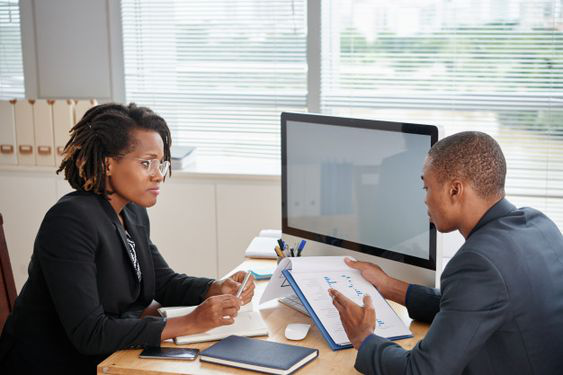

In [ ]:

url = "https://i.pinimg.com/564x/e8/e2/46/e8e2469e6a21893eb66df75ddd9869a8.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)


Arabic Flickr-Model Caption
كلب أبيض وأسود يتسلق جدار صخري في الغابة
English Flickr-Model Caption
A man in a red shirt and blue jeans is standing in front of a building with a sign
Translated Flickr-Model Caption
رجل في قميص أحمر و بنجين جينز أزرق يقف أمام مبنى مع إشارة
English COCO-Model Caption
A man and woman are working on a paper.
Translated COCO-Model Caption
رجل وامرأة يعملان على ورقة


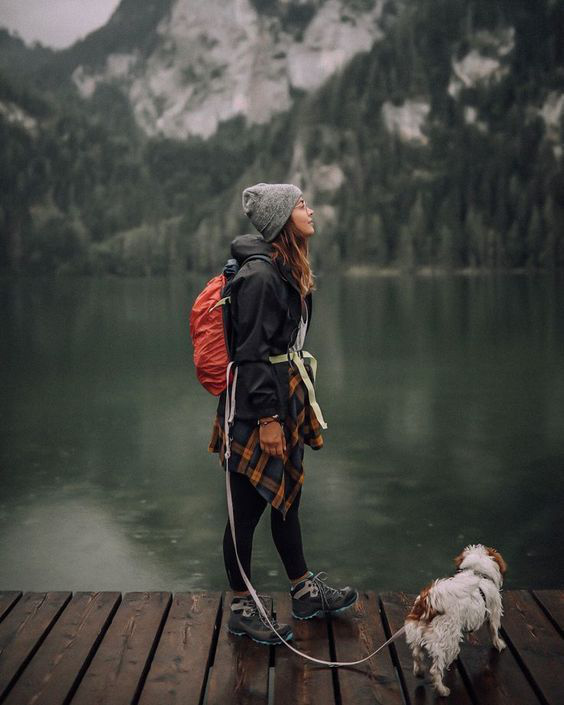

In [ ]:

url = "https://i.pinimg.com/564x/43/0a/e5/430ae5e04ba4b7be8968ae8d8735e91c.jpg"
img = Image.open(requests.get(url, stream=True).raw)
img

In [ ]:
getCaptions(img)


Arabic Flickr-Model Caption
صبي صغير في قميص أحمر ، يرتدي قميصا أزرق اللون ، يرتدي نظارة شمسية ، يجلس على
English Flickr-Model Caption
A man in a blue shirt and jeans is standing in front of a building with a sign that
Translated Flickr-Model Caption
رجل في قميص أزرق وجينز يقف أمام مبنى مع إشارة
English COCO-Model Caption
A woman holding a dog on a leash next to a boat.
Translated COCO-Model Caption
امرأة تحمل كلباً على حبل بجانب قارب
